In [1]:
%%html
<style>
/*overwrite hard coded write background by vscode for ipywidges */
.cell-output-ipywidget-background {
   background-color: transparent !important;
}

/*set widget foreground text and color of interactive widget to vs dark theme color */
:root {
    --jp-widgets-color: var(--vscode-editor-foreground);
    --jp-widgets-font-size: var(--vscode-editor-font-size);
}
</style>

In [2]:
from pathlib import Path

from pylabel import importer

DATASET = "valid"
DIR = Path("../datasets/01-polish-licence-plates") / DATASET

ds = importer.ImportCoco(DIR / "_annotations.coco.json")
display(ds.df.describe())
df = ds.df
df[:5]

,img_id,img_width,img_height,ann_bbox_xmin,ann_bbox_ymin,ann_bbox_xmax,ann_bbox_ymax,ann_bbox_width,ann_bbox_height,ann_area,ann_iscrowd,annotated
count,28.000000,28.0,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.0,28.0
mean,11.857143,640.0,640.0,213.321429,322.071429,397.895964,463.614571,184.574536,141.543143,53378.288786,0.0,1.0
std,6.905254,0.0,0.0,145.901299,148.455238,157.163224,90.552291,173.486653,168.198236,97262.673159,0.0,0.0
min,0.000000,640.0,640.0,10.000000,34.000000,115.000000,293.500000,33.000000,36.000000,1204.500000,0.0,1.0
25%,5.750000,640.0,640.0,107.250000,254.000000,292.206000,390.104250,80.374750,44.492000,4196.875000,0.0,1.0
50%,12.500000,640.0,640.0,182.500000,338.500000,384.250000,465.879500,103.893000,48.848000,5628.000000,0.0,1.0
75%,17.250000,640.0,640.0,269.250000,419.000000,535.457750,538.125000,190.582750,128.395750,24654.889000,0.0,1.0
max,23.000000,640.0,640.0,523.000000,540.000000,625.500000,639.500000,615.500000,540.500000,332677.750000,0.0,1.0


,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_iscrowd,ann_keypoints,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,,Bez_jpg.rf.310008f57835738c5f7bb5d210a2bb72.jpg,,0,640,640,,,261,435,...,0,,,,,2,license-plates,license-plates,,1
1,,01b_jpg.rf.38c1f367900a58f501b55b3fcf9f3fef.jpg,,1,640,640,,,72,87,...,0,,,,,2,license-plates,license-plates,,1
2,,NWUktkqTURBXy9lZTBkMjIwZTZjNjlmMmFiZGM4NjU5OWV...,,2,640,640,,,224,336,...,0,,,,,2,license-plates,license-plates,,1
3,,picture_jpg.rf.574626cf9301866d84dbe58a0bff582...,,3,640,640,,,188,156,...,0,,,,,2,license-plates,license-plates,,1
4,,Bez-nazwy_jpg.rf.1cd1be28d225470f0984ce8f3f40c...,,4,640,640,,,360,335,...,0,,,,,2,license-plates,license-plates,,1


In [151]:
import cv2
import numpy as np


def annotate(
    imgs: list[np.ndarray],
    contours: list[np.ndarray | list[np.ndarray]],
    color: tuple[int, int, int] = (0, 0, 255),
    thickness: int = 2,
    texts: list[list[str]] | None = None,
    font: int = cv2.FONT_HERSHEY_COMPLEX,
    txt_scale: float = 1.2,
    txt_thickness: int = 2,
    txt_color: tuple[int, int, int] = (255, 255, 255),
) -> list[np.ndarray]:
    result = []
    if texts is None:
        texts = [[]] * len(imgs)
    for img, contour_set, text_set in zip(imgs, contours, texts):
        annotated = img.copy()
        if hasattr(contour_set, "shape") and contour_set.shape[1] == 4:
            for x1, y1, x2, y2 in contour_set:
                annotated = cv2.rectangle(
                    annotated, (x1, y1), (x2, y2), color=color, thickness=thickness
                )
        else:
            annotated = cv2.drawContours(annotated, contour_set, -1, color, thickness)

            for contour, text in zip(contour_set, text_set):
                p1s = contour
                p2s = np.concatenate([contour[1:], [contour[0]]])
                xs, ys = (p2s - p1s).T
                angles = np.arctan2(ys, xs)
                angles_folded = np.abs(np.abs(angles) - np.pi / 2)
                flattest = np.argmax(angles_folded)
                p1, p2 = p1s[flattest], p2s[flattest]
                angle = -angles[flattest] / np.pi * 180
                if p1[0] > p2[0]:
                    p1, p2 = p2, p1
                    angle = -angle

                txt_img = np.zeros_like(annotated)

                txt_size, _ = cv2.getTextSize(text, font, txt_scale, txt_thickness)
                padding = int(np.ceil(0.1 * txt_size[1]))
                cv2.rectangle(txt_img, p1, p1 + txt_size + padding * 2, color, -1)

                txt_bl = (p1[0] + padding, p1[1] + padding + txt_size[1])
                cv2.putText(
                    txt_img, text, txt_bl, font, txt_scale, txt_color, txt_thickness
                )

                mat = cv2.getRotationMatrix2D(p1.astype(float), angle, 1)
                txt_img = cv2.warpAffine(txt_img, mat, tuple(annotated.shape[1::-1]))

                mask = np.repeat(txt_img.any(axis=2), 3).reshape(txt_img.shape)
                annotated = txt_img * mask + annotated * np.invert(mask)

        result.append(annotated)
    return result

In [ ]:

from utils import show_collage


filenames = df["img_filename"].unique()
imgs = [cv2.imread(str(DIR / filename)) for filename in filenames]
plates = df.loc[df["cat_name"] == "license-plates"]
all_rects = plates.loc[:, "ann_bbox_xmin":"ann_bbox_ymax"].values.astype(int)
rects = [all_rects[plates["img_filename"] == filename] for filename in filenames]


ann_gt = annotate(imgs, rects)

show_collage(ann_gt)

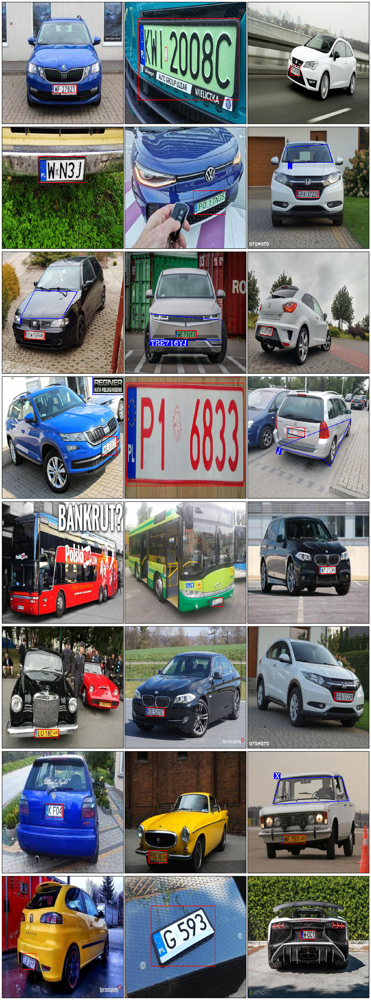

In [152]:
from twm_proj.licence_plate_detector import LicencePlateDetector

detector = LicencePlateDetector.default()

results = [[*detector.detect(img)] for img in imgs]
plate_contours = [[plate.rect for plate in result] for result in results]
texts = [[plate.text for plate in result] for result in results]

ann_preds = annotate(ann_gt, plate_contours, color=(255, 0, 0), texts=texts)
show_collage(ann_preds, col_wrap=3, height=6)